<a href="https://colab.research.google.com/github/zachary-t-denison/Multimodal-Data-Collection/blob/main/Multimodal_data_collection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import pandas
import matplotlib.pyplot

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount= True)
#force_remount is there to allow someone to rerun the cell and not cause any issues
#Mounting the drive to import our data, that means the PHD reading this, that you have to add a shortcut to your drive

Mounted at /content/drive


In [3]:
DATA_DIR = '/content/drive/MyDrive/January 2023'
#Establish the directory as the file source
Folder_Title = "Peg_Transfer_SKay_T"
#Every folder in the data set contains that initial string
# Suppose DATA_DIR = "/mnt/data"
trial_map     = {}
#Hash map that has the trial number as the key and the value as the path to it in drive

In [4]:
for folder in os.listdir(DATA_DIR):
  if Folder_Title in folder:
      #I wanted to expand this code to be easily scalable, meaning you would just need to add folders containing the necessary files to the drive, with no importing into colab or whatever else.
      #The goal was to impress because I couldn't run the simulator on my mac
      final_index = folder.find('_', 18)
      trial_map.update({int(folder[19:final_index]):DATA_DIR + "/" + folder})

trial_map = dict(sorted(trial_map.items()))

In [5]:
padded = {}
for k, v in trial_map.items():
    new_key = str(k).zfill(2)   # '4' → '04', '12' → '12'
    #https://www.w3schools.com/python/ref_string_zfill.asp
    padded[new_key] = v

trial_map = padded


In [6]:
print(trial_map)

{'02': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T2_27-01-2023_16-11-31', '03': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T3_27-01-2023_16-27-20', '04': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T4_27-01-2023_16-37-50', '05': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T5_27-01-2023_16-51-23', '06': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T6_27-01-2023_17-05-21', '07': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T7_27-01-2023_17-14-44', '09': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T9_27-01-2023_17-40-21', '10': '/content/drive/MyDrive/January 2023/Peg_Transfer_SKay_T10_27-01-2023_17-45-59'}


In [7]:
aligned_trial_files = {}
for trial_num, folder_path in trial_map.items():
  raven_csv_path  = f"{folder_path}/Peg_Transfer_S01_T{trial_num}.csv"
  trak_csv_path   = f"{folder_path}/Peg_Transfer_S01_T{trial_num}_trakStar_final.csv"
  raven_csv = pandas.read_csv(raven_csv_path)
  trak_csv  = pandas.read_csv(trak_csv_path)
  aligned_trial_files[trial_num] = (raven_csv, trak_csv)



In [8]:
for trial_num, (raven_csv, trak_csv) in aligned_trial_files.items():
    shared     = set(raven_csv['Timestamp']) & set(trak_csv['Frame timestamp'])
    raven_csv  = raven_csv[raven_csv['Timestamp'].isin(shared)].reset_index(drop=True)
    trak_csv   = trak_csv[trak_csv['Frame timestamp'].isin(shared)].reset_index(drop=True)

    trak_csv.rename(columns={'Relative frame #' : 'Frame'}, inplace=True)

    to_drop = ['True frame #', 'Trackstar time']
    raven_csv.drop(columns=to_drop, errors='ignore', inplace=True)
    trak_csv.drop(columns=to_drop, errors='ignore', inplace=True)

    min_len   = min(len(raven_csv), len(trak_csv))
    raven_csv = raven_csv.iloc[:min_len].reset_index(drop=True)
    trak_csv  = trak_csv.iloc[:min_len].reset_index(drop=True)

    aligned_trial_files[trial_num] = (raven_csv, trak_csv)


In [9]:
print(aligned_trial_files)

{'02': (       PSML_position_x  PSML_position_y  PSML_position_z  PSMR_position_x  \
0             388.8325        27.458790        -75.73495         404.8500   
1             388.8325        27.458790        -75.73495         404.7940   
2             388.8325        27.402980        -75.73495         404.7940   
3             388.8325        27.402980        -75.73495         404.7380   
4             388.8880        27.291370        -75.67910         404.7380   
...                ...              ...              ...              ...   
11587         371.0285        37.672135       -157.49750         444.3635   
11588         367.9590        40.685900       -156.88350         442.2985   
11589         365.0010        43.755500       -155.26500         440.7360   
11590         362.4335        45.597250       -153.20000         438.6150   
11591         388.9435        26.844890        -75.79070         404.5705   

       PSMR_position_y  PSMR_position_z  PSML_gripper_angle  \
0   

<ipython-input-11-26c61cd27820>:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  matplotlib.pyplot.figure(figsize=(10, 5))


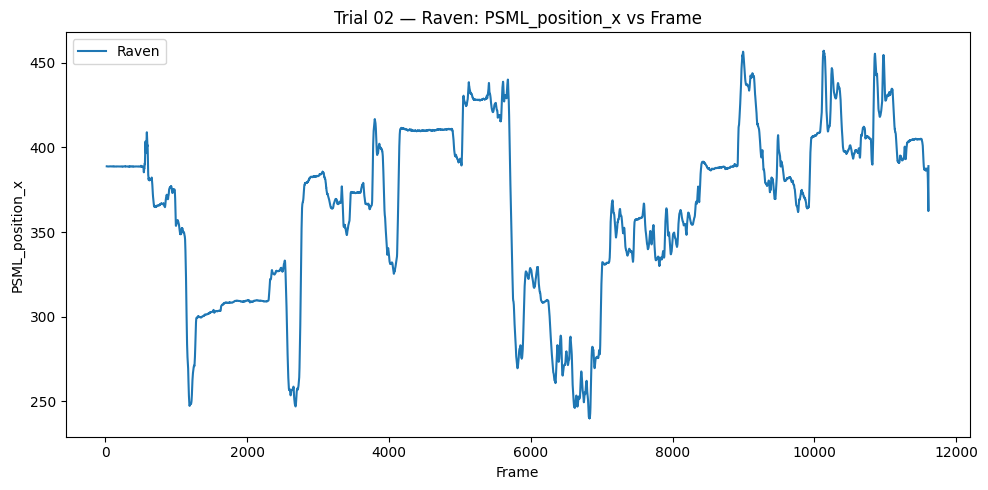

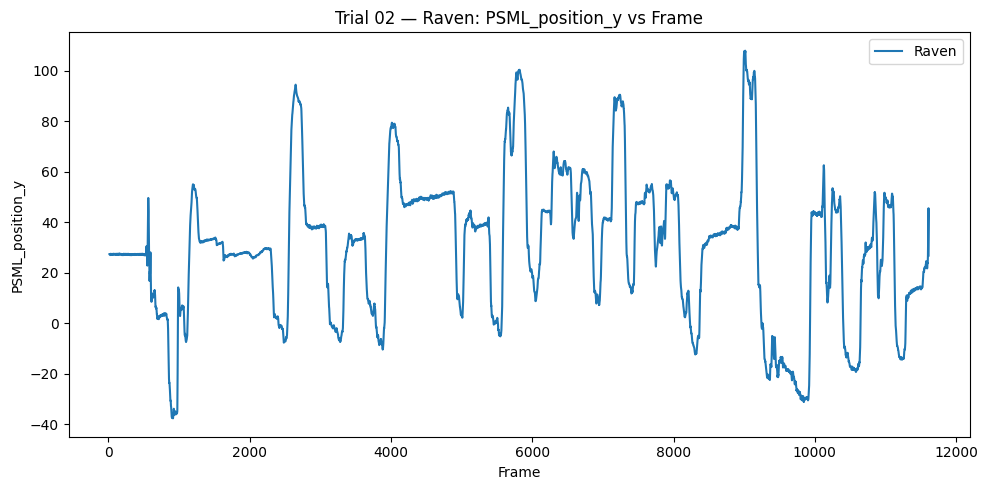

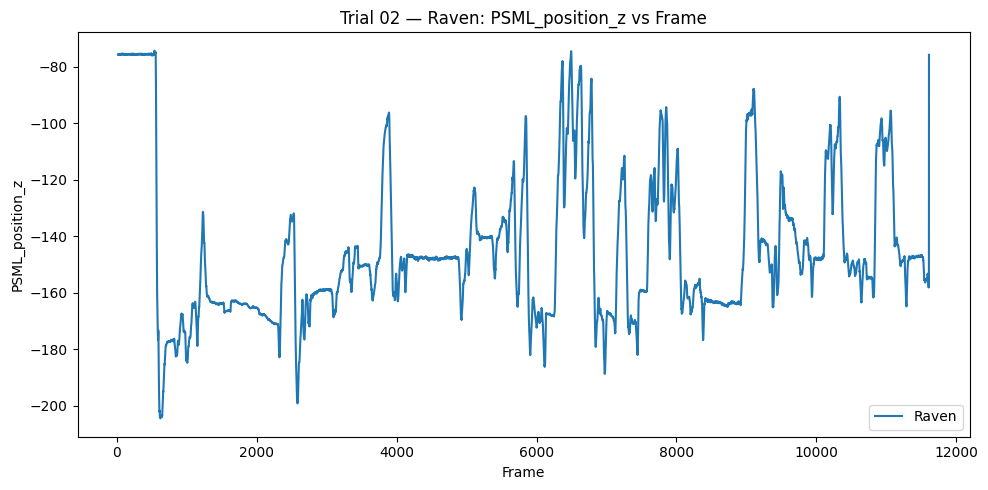

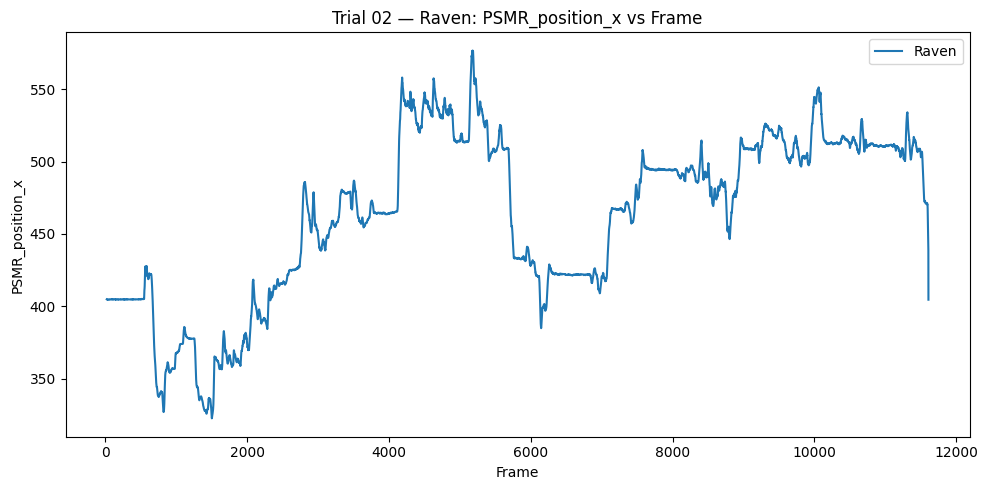

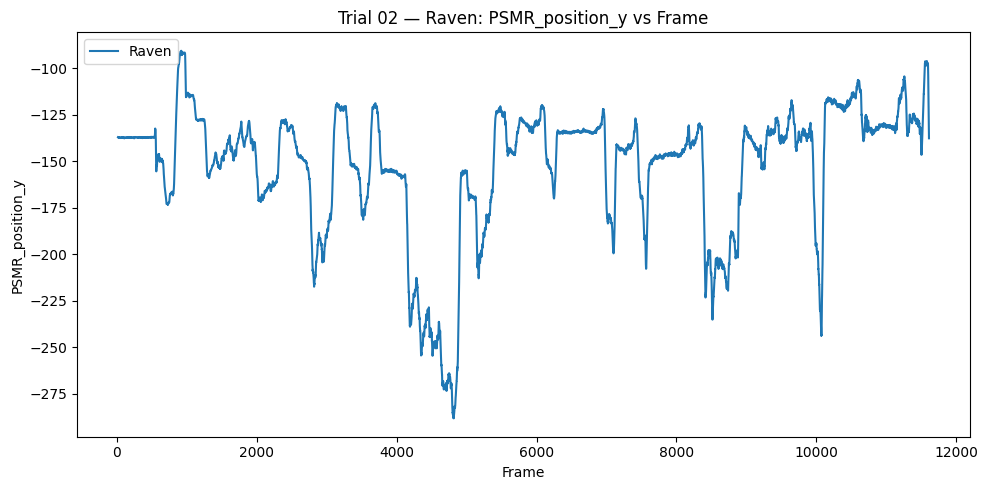

...

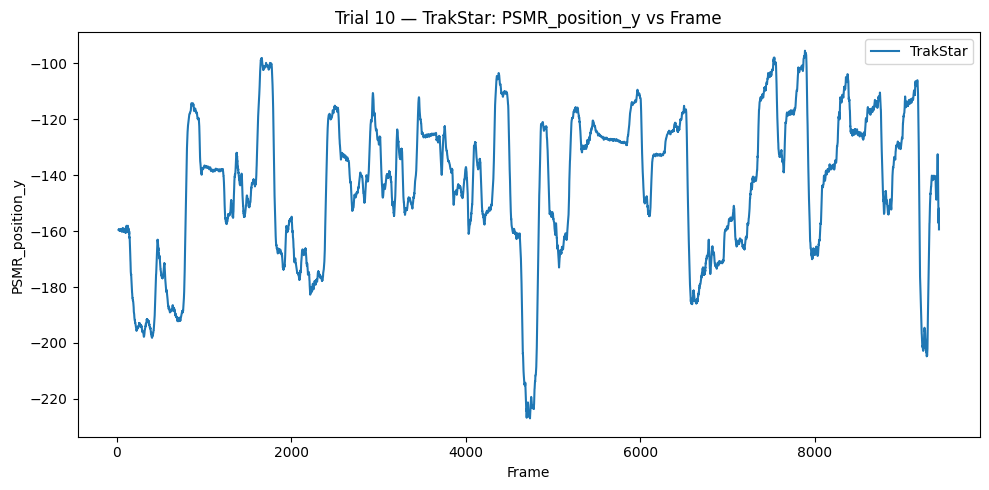

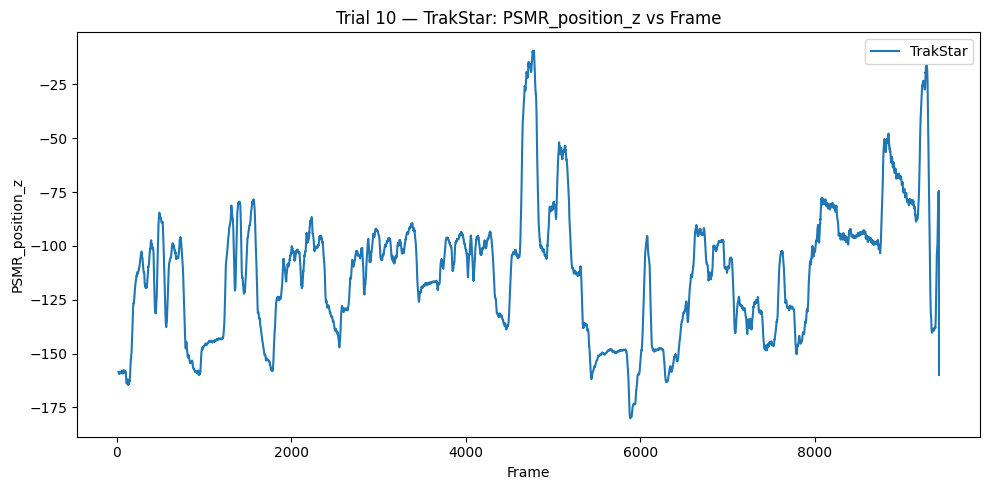

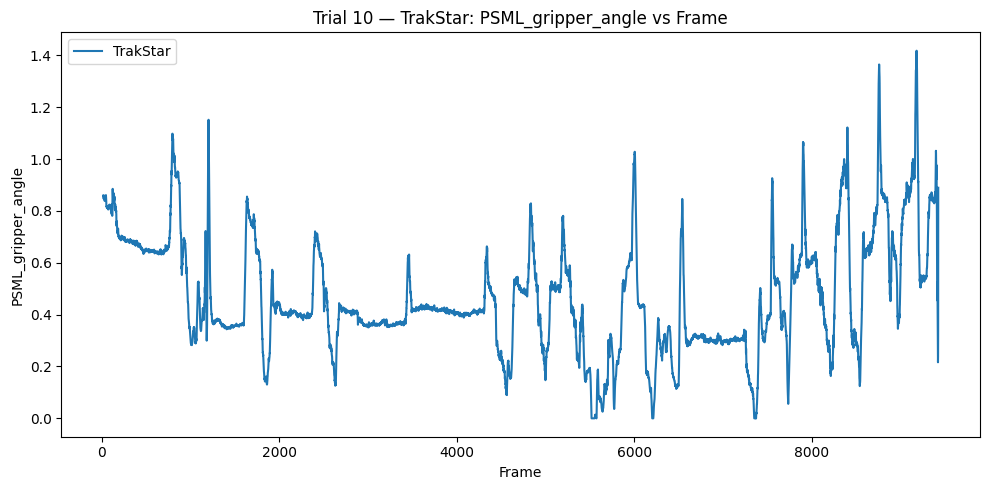

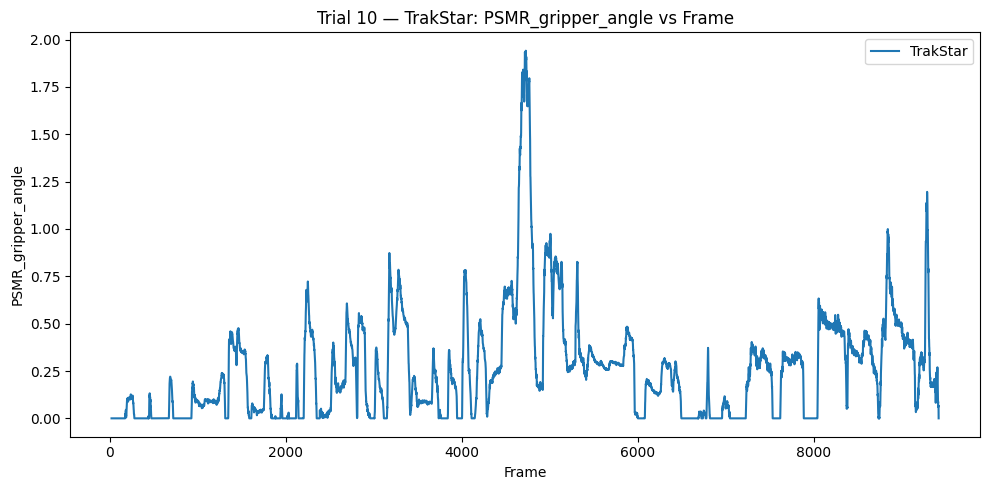

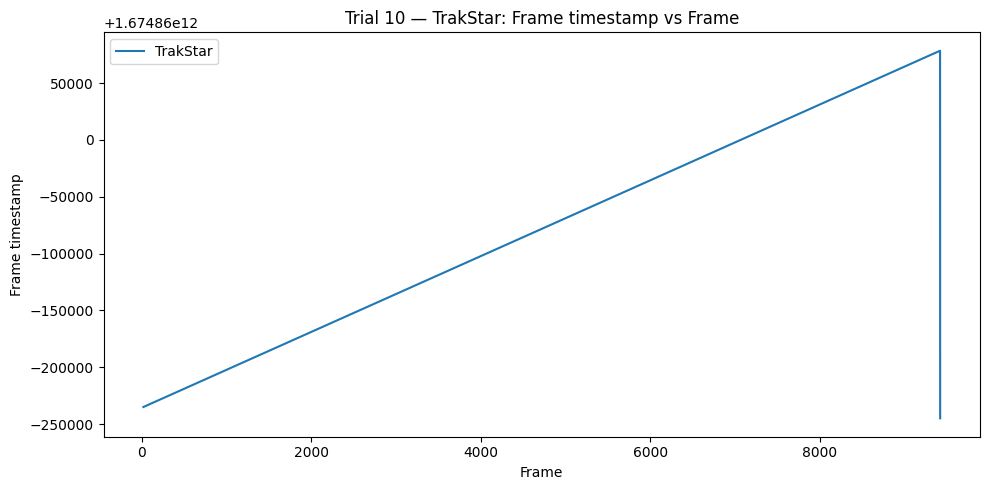

In [11]:
RAVEN_DIR    = '/content/drive/MyDrive/Raven_Plots'
TRAKSTAR_DIR = '/content/drive/MyDrive/TrakStar_Plots'

for d in (RAVEN_DIR, TRAKSTAR_DIR):
    os.makedirs(d, exist_ok=True)

for trial_num, (raven_csv, trak_csv) in aligned_trial_files.items():
    for col in raven_csv.columns:
        if col == 'Frame':
            continue
        trial_label = "T{}".format(trial_num)
        filename    = "{}_{}.png".format(trial_label, col)
        matplotlib.pyplot.figure(figsize=(10, 5))
        matplotlib.pyplot.plot(raven_csv['Frame'], raven_csv[col], label='Raven')
        matplotlib.pyplot.xlabel('Frame')
        matplotlib.pyplot.ylabel(col)
        matplotlib.pyplot.title("Trial {} — Raven: {} vs Frame".format(trial_num, col))
        matplotlib.pyplot.legend()
        matplotlib.pyplot.tight_layout()
        out_path = os.path.join(RAVEN_DIR, filename)
        matplotlib.pyplot.savefig(out_path, dpi=300)

    for col in trak_csv.columns:
        if col == 'Frame':
            continue
        trial_label = "T{}".format(trial_num)
        filename    = "{}_{}.png".format(trial_label, col)
        matplotlib.pyplot.figure(figsize=(10, 5))
        matplotlib.pyplot.plot(trak_csv['Frame'], trak_csv[col], label='TrakStar')
        matplotlib.pyplot.xlabel('Frame')
        matplotlib.pyplot.ylabel(col)
        matplotlib.pyplot.title("Trial {} — TrakStar: {} vs Frame".format(trial_num, col))
        matplotlib.pyplot.legend()
        matplotlib.pyplot.tight_layout()
        out_path = os.path.join(TRAKSTAR_DIR, filename)
        matplotlib.pyplot.savefig(out_path, dpi=300)


In [12]:
aligned_trial_files_updated = {}

for trial_num, (raven_csv, trak_csv) in aligned_trial_files.items():
    trak_copy = trak_csv.copy()
    for col in raven_csv.columns:
        if col == 'Frame' or col not in trak_copy.columns:
            continue
        raw_r = raven_csv[col].corr(trak_copy[col])
        if raw_r < 0:
            trak_copy[col] *= -1
        scale  = raven_csv[col].std() / trak_copy[col].std()
        ts1    = trak_copy[col] * scale
        offset = raven_csv[col].mean() - ts1.mean()
        trak_copy[col] = ts1 + offset
    aligned_trial_files_updated[trial_num] = (raven_csv, trak_copy)


In [13]:
comparison_results = []

for trial_num, (raven_csv, trak_csv) in aligned_trial_files.items():
    for col in raven_csv.columns:
        if col == 'Frame':
            continue
        if col in trak_csv.columns:
            rv = raven_csv[col]
            ts = trak_csv[col]

            # Pearson r (pandas uses SciPy under the hood, no NumPy call needed here)
            raw_r = rv.corr(ts)
            comparison_results.append((trial_num, col, raw_r))

            # OPTIONAL: basic alignment transform (scale / shift / invert) …
            # … then any MAE or other metric can be built without NumPy too
            # mae = (rv - ts_transformed).abs().mean()

# ---- find the worst pair without NumPy ------------------------------------
df = pandas.DataFrame(comparison_results, columns=['trial', 'column', 'pearson_r'])

worst_row = df.loc[df['pearson_r'].idxmin()]     # Series.idxmin() → index of smallest value
print("Lowest correlation is ", round(worst_row.pearson_r, 3),
      " for trial ", worst_row.trial,
      ", column '", worst_row.column, "'", sep='')



Lowest correlation is 1.0 for trial 02, column 'PSMR_position_z'


In [19]:
tolerance = 0.0
max_error = 0.0
for raven_csv, trak_csv in aligned_trial_files.values():
    shared_cols = [c for c in raven_csv.columns
                   if c in trak_csv.columns and c != 'Frame']

    for col in shared_cols:
        r = pandas.to_numeric(raven_csv[col], errors='coerce')
        t = pandas.to_numeric(trak_csv[col],  errors='coerce')

        current_max = (r - t).abs().max(skipna=True)
        if current_max > max_error:
            max_error = current_max

print(max_error)













1.1368683772161603e-13
